In [1]:
import argparse
import numpy as np
import cv2, os, time
from meta import sample_filepath
from nmf import accelerated_HALS, accelerated_MU
import matplotlib
# matplotlib.use('agg') # fix pyplot hangs in wsl2 https://github.com/matplotlib/matplotlib/issues/22385
import matplotlib.pyplot as plt
from IPython.display import clear_output



In [2]:
NMF_algo_list = [
    "HALS_Accel_L30",
    "HALS_Accel_L60",
    "HALS_Accel_L120",
    "HALS_Accel_L180",
    "HALS_Accel_L240",
    "HALS_Accel_L360",
    "HALS_L30",
    "HALS_L60",
    "MU_Accel_L30",
    "MU_Accel_L60",
    "MU_L30",
    "MU_L60"
]
output_recon_images = False
r = "/mnt/i/dataset-processed"
filepaths = os.listdir(r)
filepaths = [os.path.join(r, f) for f in filepaths if f.split(".")[-1].lower() in ["jpeg","jpg","png"]]

sample_indices = [] 
for idf, f in enumerate(filepaths):
    for i in range(len(sample_filepath)):
        if sample_filepath[i] == f.split("/")[-1]:
            sample_indices.append(idf)



/home/anvuong/miniconda3/envs/tf14/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


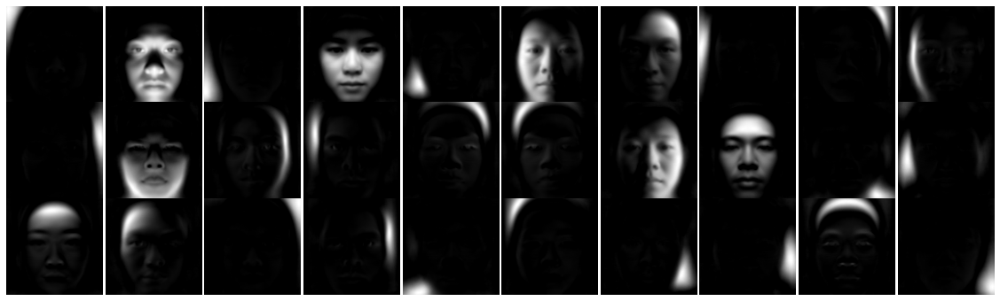

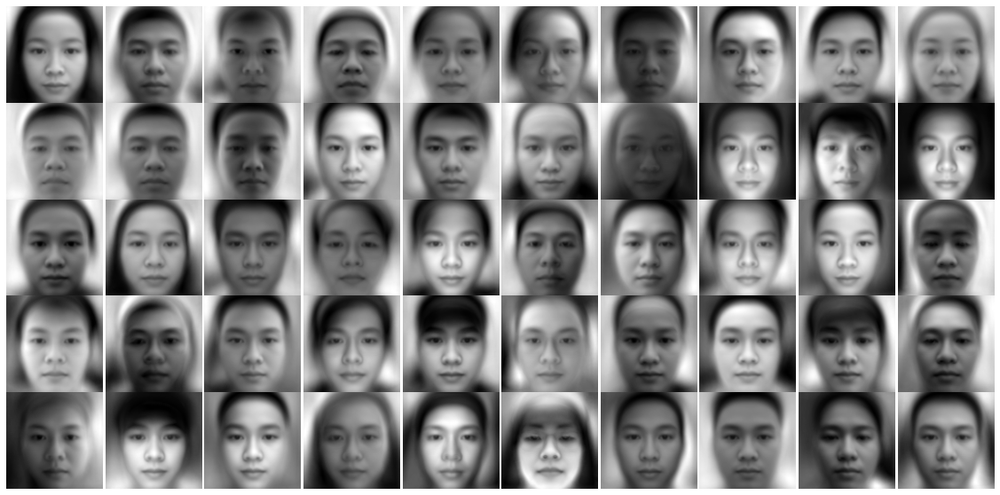

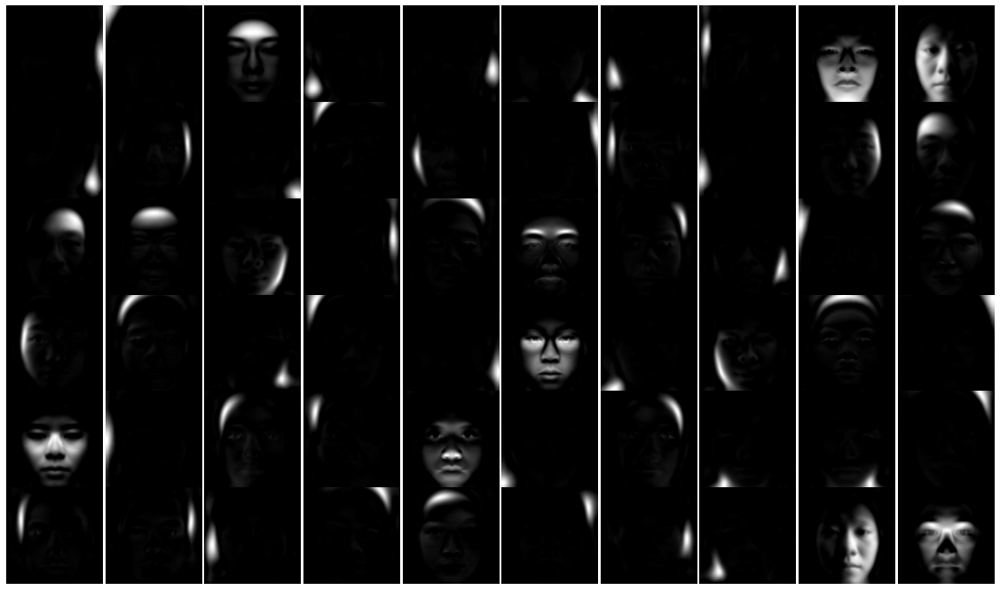

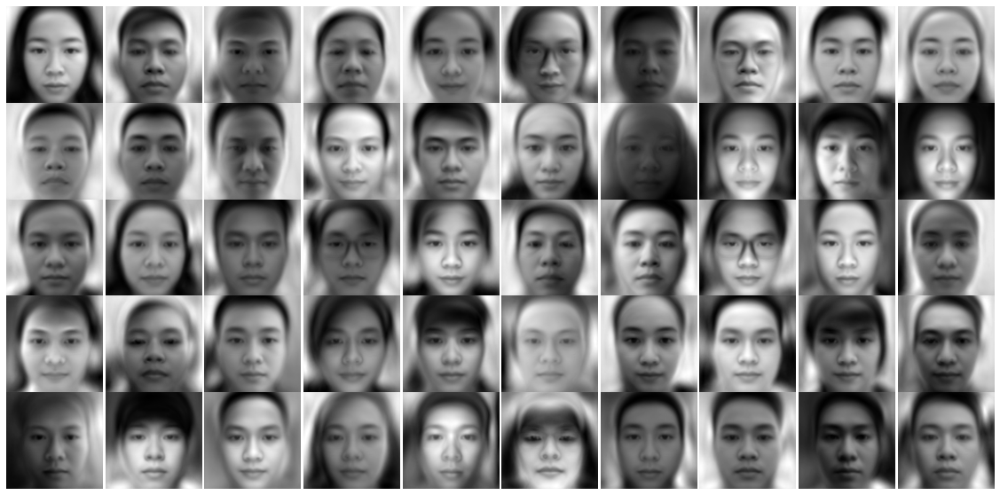

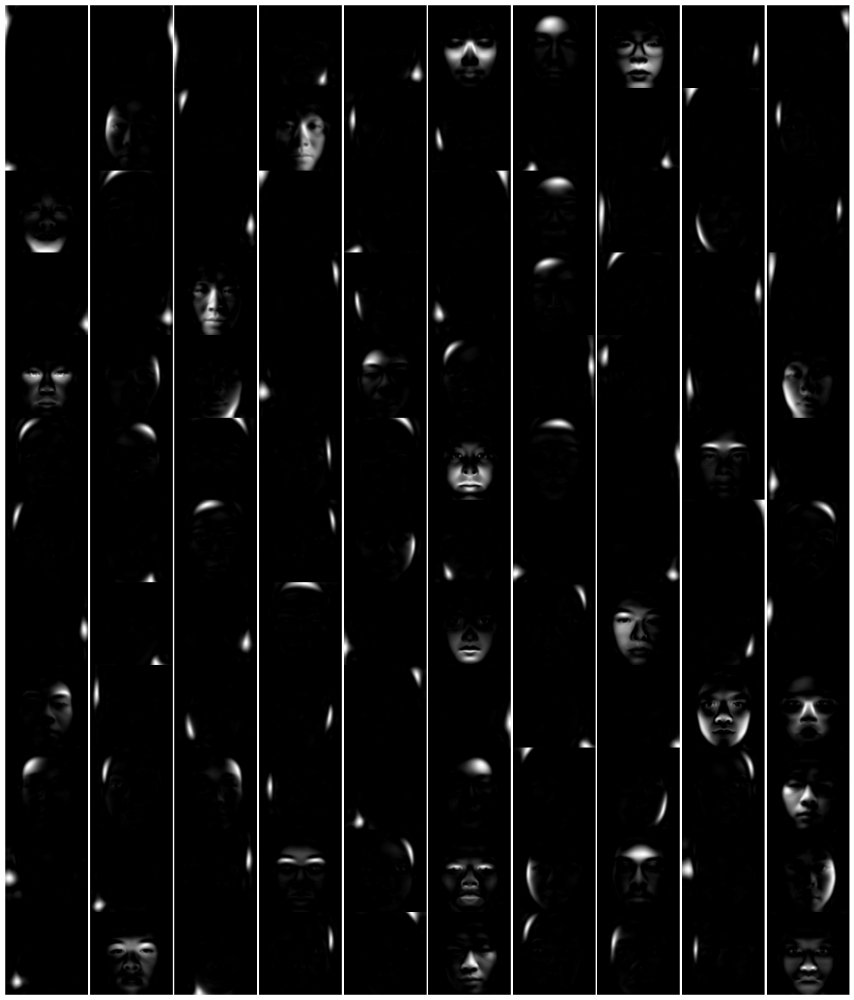

...

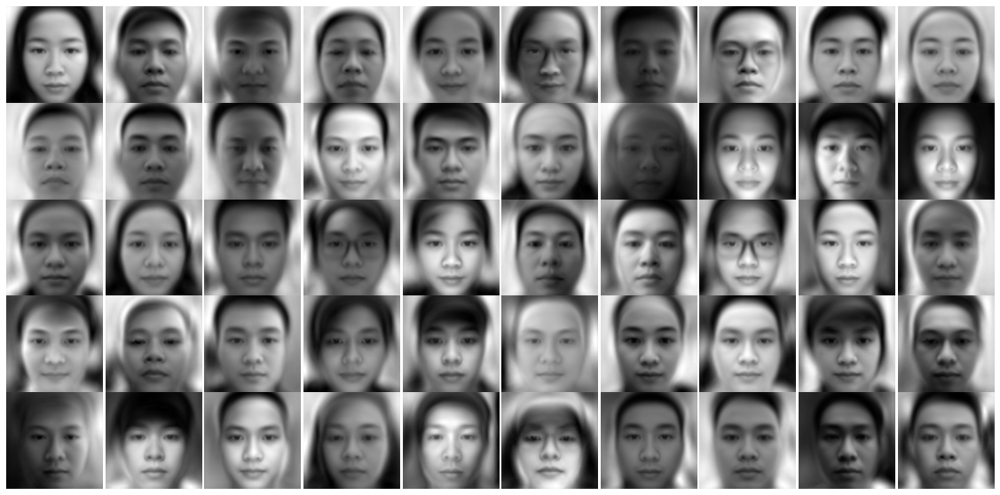

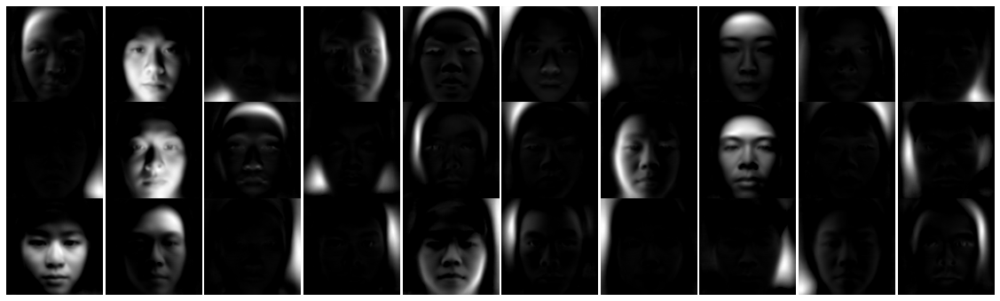

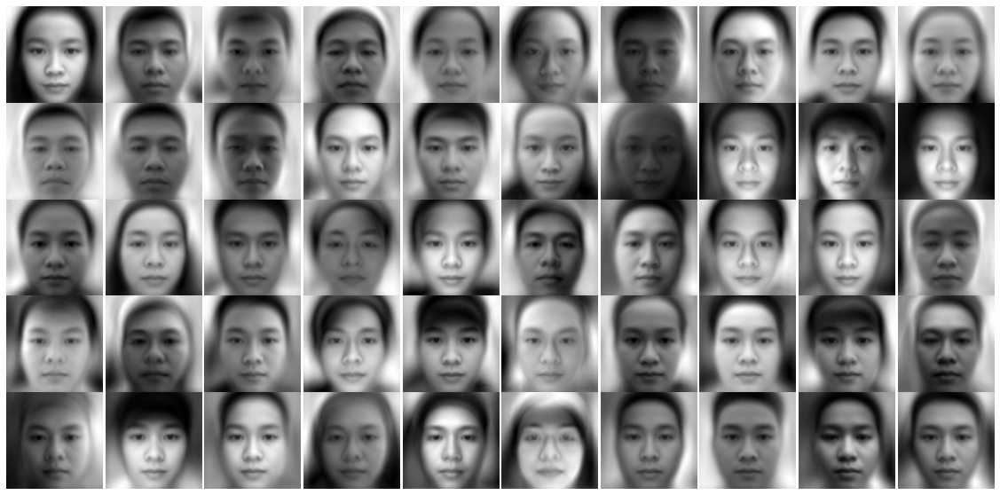

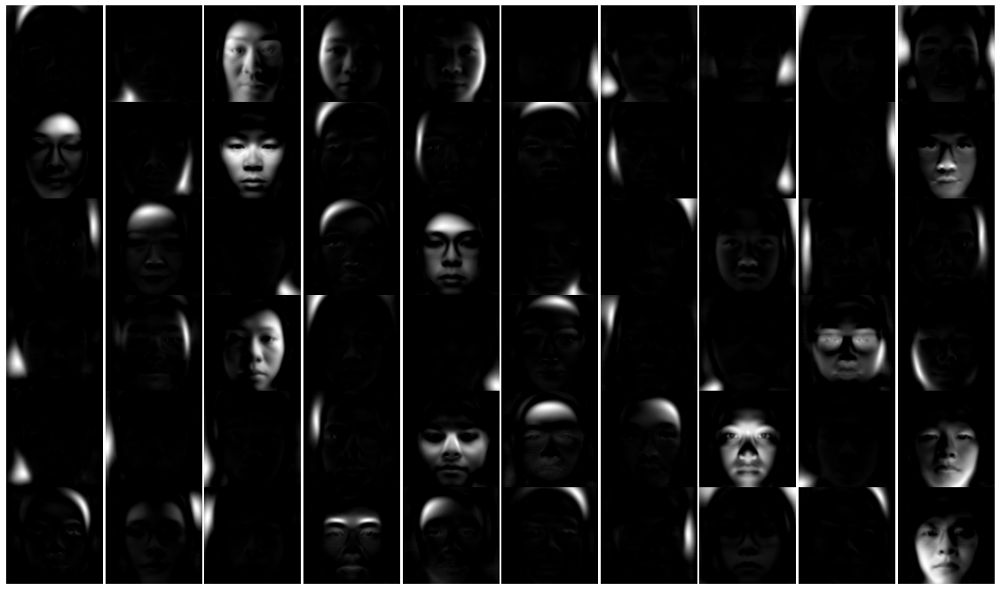

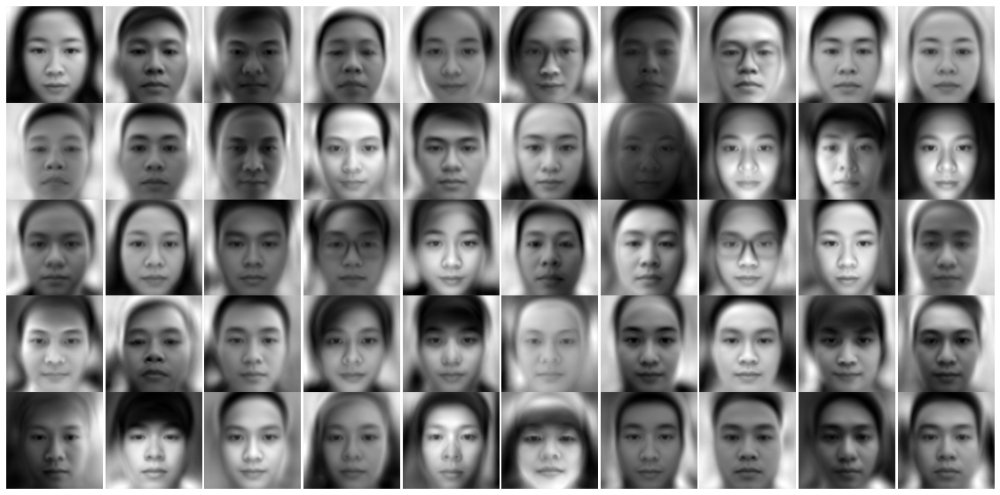

In [3]:
# generate plots
for inmf, nmf in enumerate(NMF_algo_list):
    W = np.load(nmf + "/weights/matrix_W.npy")
    H = np.load(nmf + "/weights/matrix_H.npy")
    X_reconst = np.matmul(W,H)
    L = W.shape[1]
    fig, axes = plt.subplots(L//10,10, figsize=(20, L//5))
    axes = axes.ravel()
    for i in range(len(axes)):
        axes[i].imshow(W[:,i].reshape((112,112)), cmap='gray')
        axes[i].axis('off')

    # plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    fig.savefig(nmf + "/NMF_components.png")

    fig, axes = plt.subplots(5,10, figsize=(20,10))
    axes = axes.ravel()
    for i in range(len(axes)):
        axes[i].imshow(X_reconst[:,sample_indices[i]].reshape((112,112)), cmap="gray")
        axes[i].axis('off')

    # plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    fig.savefig(nmf + "/Sample_reconstruction.png")

    if output_recon_images:
        s = nmf + "/reconstruc_images"
        print(f"Generate plots done, outputing reconstructed images to {s}")
        for i in range(X_reconst.shape[1]):
            img = X_reconst[:,i].reshape((112,112))
            img_path = os.path.join(s, filepaths[i].split("/")[-1])
            print(f"{i} {img_path}")
            cv2.imwrite(img_path, img)
            if i%20==0:
                clear_output(wait=True)